### Data analysis of Section 8 data.

In [1]:
import numpy as np
import pandas as pd
import scipy.io

import matplotlib.pyplot as plt
import sys
sys.path.insert(0, '../')
from M1S_tools import *
import glob

plt.set_cmap('jet')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
## bending modes & influence matrices etc from Buddy #####################
ML actuators =  165 165
Afn =  (6991, 165)
fv =  (165, 165)
U matrix (6991, 165)
N node =  6991
## bending modes & influence matrices etc from Trupti #####################
N actuators =  170
/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents/influnce_matrix_files/OA_influence_matrices_all/OA_surface_normal_165SA_09Jan2025/
Afz =  (27547, 165)
Afx =  (27547, 165)
Afy =  (27547, 165)
U

<Figure size 640x480 with 0 Axes>

In [2]:
dateID = '250114'

### Step 6: repeatedly measure for 1 hour

Plot them, fit them, then check coefficients in 2 ways (vs Zernike index, and vs time)

In [3]:
stepN = 6
globstring = '%s/Sec 8/%s*step %d*.h5'%(ml_data_dir, dateID, stepN) #not using dateID. Data split into 0117 and 0121
#print(globstring)
fileset = sorted(glob.glob(globstring))
nMeasure = len(fileset)

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set01 gmtMorph170614 -.h5: Tue Jan 14 12:31:15 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set02 gmtMorph170614 -.h5: Tue Jan 14 12:34:29 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set03 gmtMorph170614 -.h5: Tue Jan 14 12:37:45 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set04 gmtMorph170614 -.h5: Tue Jan 14 12:41:00 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set05 gmtMorph170614 -.h5: Tue Jan 14 12:44:15 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set06 gmtMorph170614 -.h5: Tue Jan 14 12:47:30 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 6 set07 gmtMorph170

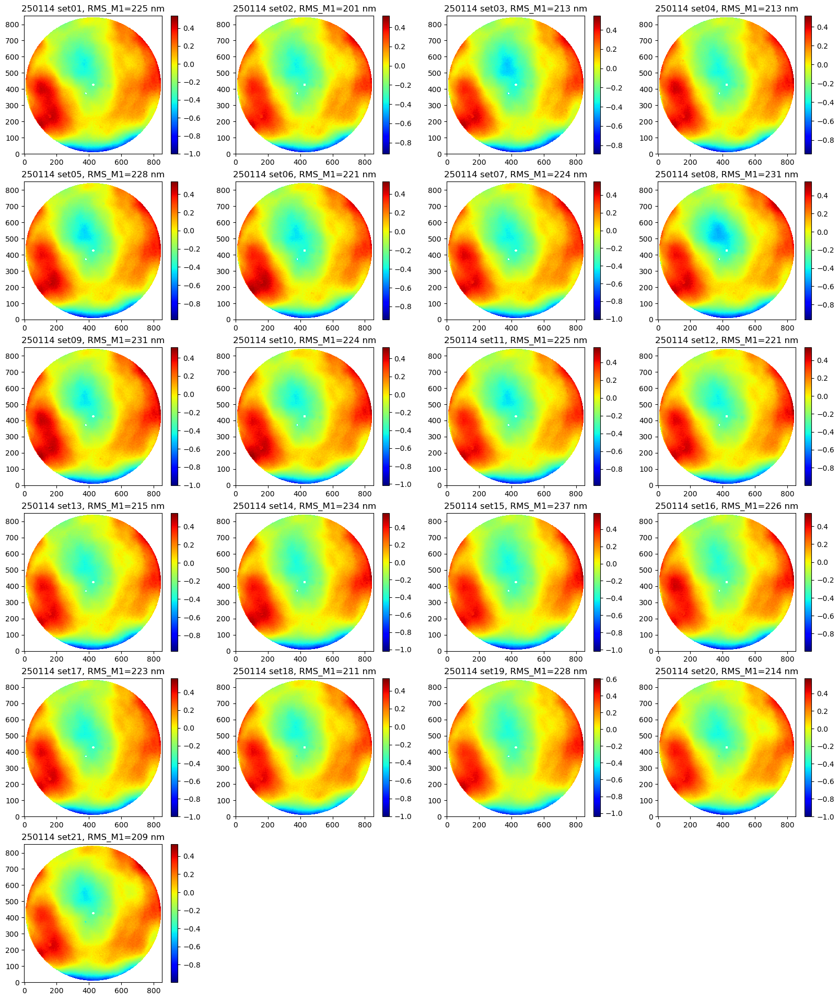

In [4]:
nrow = int(np.ceil(nMeasure/4.))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    #print(irow, icol)
    glob_string = '%s/Sec 8/%s*step %d set%02d*-.h5'%(ml_data_dir,dateID, stepN, i+1)
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, fileset)
    if len(fileset)>0:
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
        ts_array.append(ts)

        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        img = ax[irow][icol].imshow(m1s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%s set%02d, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
for i in range(nMeasure, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

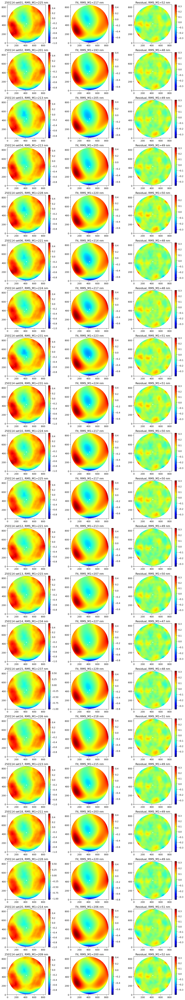

In [5]:
nzer = 22
zercoeff = np.zeros((nMeasure, nzer))

[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)
r1 = np.sqrt(x1**2 + y1**2)

nnodes = x1.shape[0]*x1.shape[1]
zerU = np.zeros((nnodes, nzer))
for i in range(nzer):
    zerU[:,i] = zernike_polynomial(i+1, x1/radius_of_CA, y1/radius_of_CA).flatten()

nrow = nMeasure
fig, ax = plt.subplots(nrow,3,figsize=(12,3*nrow))
ts_array = []
for i in range(nMeasure):
    irow = i
    #print(irow, icol)
    glob_string = '%s/Sec 8/%s*step %d set%02d*-.h5'%(ml_data_dir,dateID, stepN, i+1)
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, fileset)
    if len(fileset)>0:
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset, verbose=False)
        ts_array.append(ts)

        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        icol = 0
        img = ax[irow][icol].imshow(m1s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%s set%02d, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
        
        icol = 1
        maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
        nnodesNew = np.sum(maskNew)
        zercoeff[i,:] = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
        recon = np.zeros_like(m1s)
        recon[~maskNew] = np.nan
        for k in range(nzer):
            recon[maskNew] += zercoeff[i,k]*zerU[maskNew.flatten(),k]  
        img = ax[irow][icol].imshow(recon, origin='lower')          
        fig.colorbar(img, ax=ax[irow][icol])
        m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
        ax[irow][icol].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))
        
        icol = 2
        resi = m1s - recon
        img = ax[irow][icol].imshow(resi, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])        
        m1rms = np.std(resi[~np.isnan(resi)])*1000 #convert into nm
        ax[irow][icol].set_title('Residual, RMS_M1=%.0f nm'%(m1rms))        
plt.tight_layout()

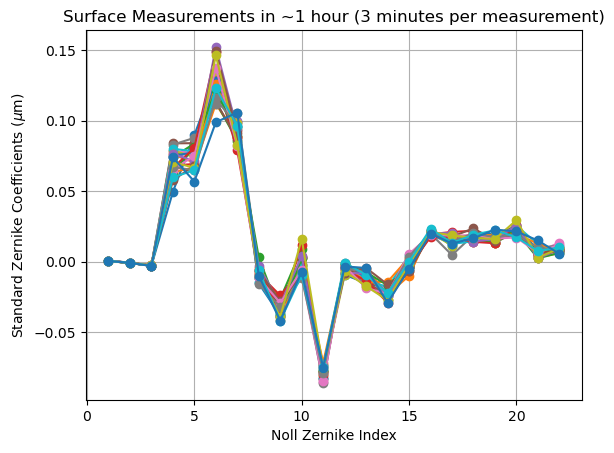

In [6]:
plt.plot(np.arange(1, nzer+1), zercoeff.T,'-o')
plt.ylabel(r'Standard Zernike Coefficients ($\mu$m)')
plt.xlabel('Noll Zernike Index')
plt.title('Surface Measurements in ~1 hour (3 minutes per measurement)')
plt.grid();

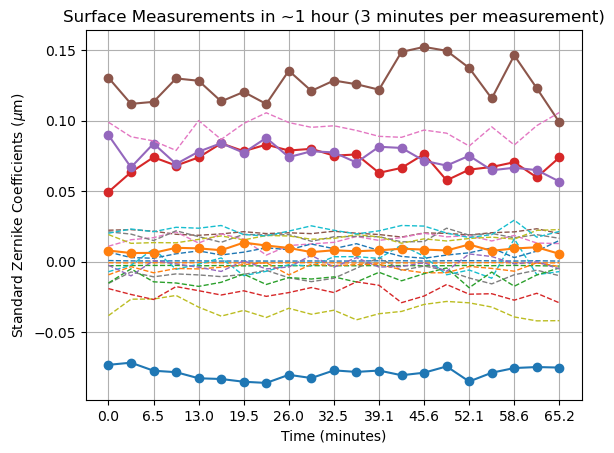

In [7]:
for i in range(nzer):
    if (i+1) in [4,5,6,11,22,37]:
        plt.plot(np.arange(1, nMeasure+1), zercoeff[:,i],'-o',label='z%d'%(i+1))
    else:
        plt.plot(np.arange(1, nMeasure+1), zercoeff[:,i],'--', linewidth=1)
plt.ylabel(r'Standard Zernike Coefficients ($\mu$m)')
plt.xlabel('Time (minutes)')
plt.title('Surface Measurements in ~1 hour (3 minutes per measurement)')
tt = np.array([unix_ts(ts)/60. for ts in ts_array])
tt -= tt[0]
tt = ['%.1f'%i for i in tt]
plt.xticks(np.arange(1,nMeasure+1,2), tt[::2])
plt.grid();

### Step 7. before & after applying +/-500nm of BM1, BM2, & +/-400nm of BM14

In [8]:
ts_array[-1]

'Tue Jan 14 13:36:27 2025'

In [9]:
glob_string = '%s/Sec 8/%s*Initial*-.h5'%(ml_data_dir,dateID)
fileset = sorted(glob.glob(glob_string))
#print(glob_string, fileset)
if len(fileset)>0:
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset) #, verbose=False)
    m1sPrev = m1s.copy()
    tsPrev = ts #string cannot be copied. just assign it

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 Initial set01 gmtMorph170614 -.h5: Tue Jan 14 14:25:01 2025 


/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 +500nmBM1 set01 gmtMorph170614 -.h5: Tue Jan 14 14:28:35 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 +500nmBM2 set01 gmtMorph170614 -.h5: Tue Jan 14 14:32:27 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 -500nmBM1 set01 gmtMorph170614 -.h5: Tue Jan 14 14:36:14 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 -500nmBM2 set01 gmtMorph170614 -.h5: Tue Jan 14 14:40:19 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 +400nmBM14 set01 gmtMorph170614 -.h5: Tue Jan 14 14:43:50 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 -400nmBM14 set01 gmtMorph170614 -.h5: Tue Jan 14 14:47:22 2025 


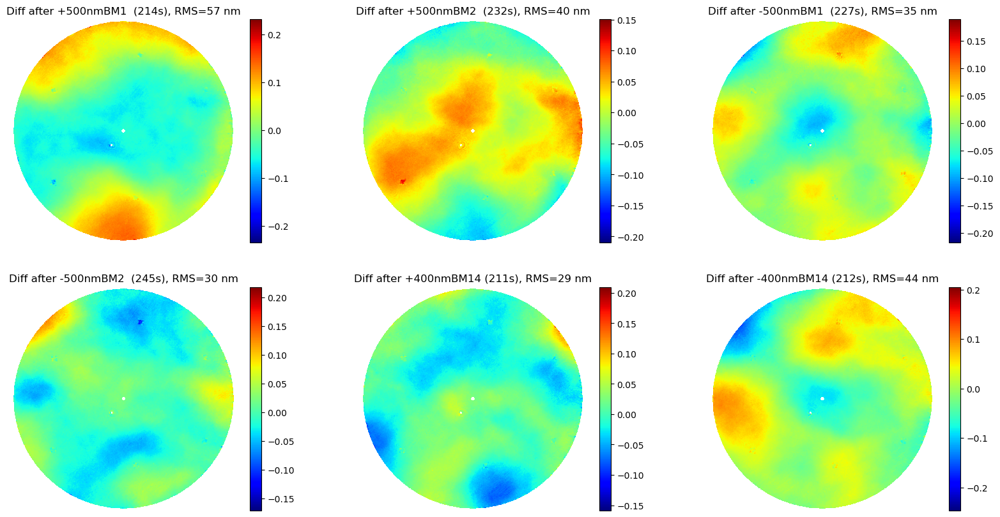

In [10]:
stepN = 7

fig, ax = plt.subplots(2,3,figsize=(20,10))
signedbend = ['+500nmBM1 ', '+500nmBM2 ', '-500nmBM1 ', '-500nmBM2 ', '+400nmBM14', '-400nmBM14']

for i,bend in enumerate(signedbend):
    glob_string = '%s/Sec 8/%s*step %d*%s*-.h5'%(ml_data_dir,dateID, stepN, bend)
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, len(fileset))
    if len(fileset)==1:
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset) #, verbose=False)
    #print(bend, i)
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    m1sdiff = m1s - m1sPrev
    m1rms = np.std(m1sdiff[~np.isnan(m1sdiff)])*1000 #convert into nm
    img = ax[irow][icol].imshow(m1sdiff, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('Diff after %s (%.0fs), RMS=%.0f nm'%(bend, unix_ts(ts)-unix_ts(tsPrev), m1rms))
    ax[irow][icol].axis('off')    
    m1sPrev = m1s.copy()
    tsPrev = ts

### Step 12. hold mode 14 for 1 hour

Plot them, fit them, then check coefficients in 2 ways (vs Zernike index, and vs time)

In [11]:
stepN = 12
globstring = '%s/Sec 8/%s*step %d*.h5'%(ml_data_dir, dateID, stepN) #not using dateID. Data split into 0117 and 0121
#print(globstring)
fileset = sorted(glob.glob(globstring))
nMeasure = len(fileset)
print(nMeasure)

30


/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 12 400nmMode14 set01 gmtMorph170614 -.h5: Tue Jan 14 14:58:25 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 12 400nmMode14 set02 gmtMorph170614 -.h5: Tue Jan 14 15:01:28 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 12 400nmMode14 set03 gmtMorph170614 -.h5: Tue Jan 14 15:04:32 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 12 400nmMode14 set04 gmtMorph170614 -.h5: Tue Jan 14 15:07:36 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 12 400nmMode14 set05 gmtMorph170614 -.h5: Tue Jan 14 15:10:40 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 12 400nmMode14 set06 gmtMorph170614 -.h5: Tue Jan 14 15:13:44 2025 
/Users/bxin/GMT_docs/1_M1/Analysis

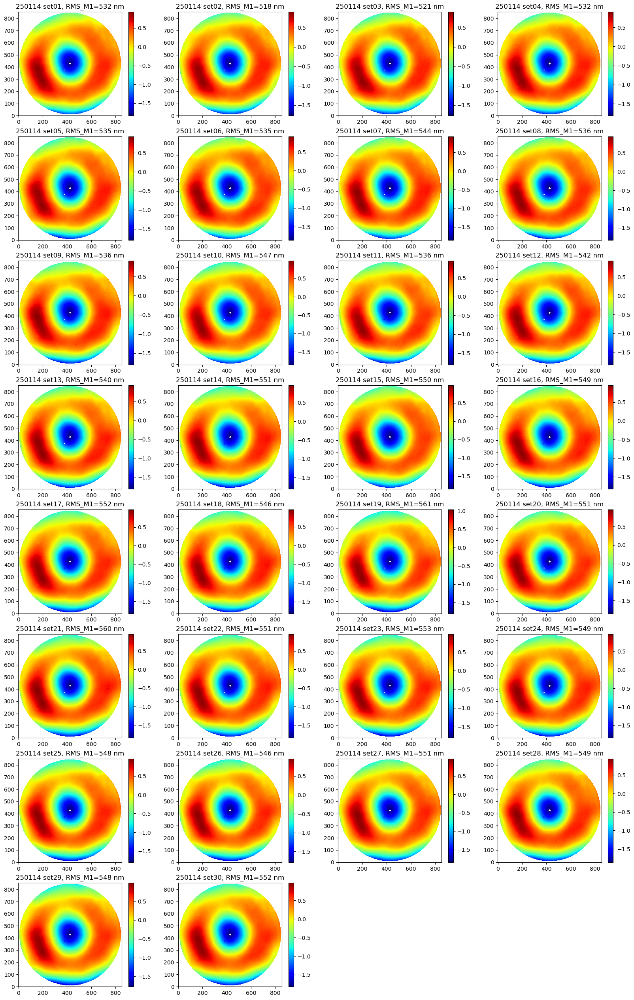

In [12]:
nrow = int(np.ceil(nMeasure/4.))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    #print(irow, icol)
    glob_string = '%s/Sec 8/%s*step %d *set%02d*-.h5'%(ml_data_dir,dateID, stepN, i+1)
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, fileset)
    if len(fileset)==1:
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
        ts_array.append(ts)

        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        img = ax[irow][icol].imshow(m1s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%s set%02d, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
for i in range(nMeasure, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

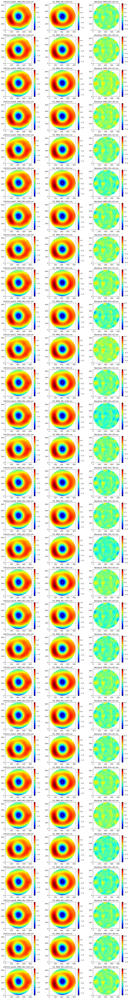

In [13]:
#nzer = int(#(6*7)/2+1)
nzer = int((8*9)/2+1) 
zercoeff = np.zeros((nMeasure, nzer))

[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)
r1 = np.sqrt(x1**2 + y1**2)

nnodes = x1.shape[0]*x1.shape[1]
zerU = np.zeros((nnodes, nzer))
for i in range(nzer):
    zerU[:,i] = zernike_polynomial(i+1, x1/radius_of_CA, y1/radius_of_CA).flatten()

nrow = nMeasure
fig, ax = plt.subplots(nrow,3,figsize=(12,3*nrow))
ts_array = []
for i in range(nMeasure):
    irow = i
    #print(irow, icol)
    glob_string = '%s/Sec 8/%s*step %d *set%02d*-.h5'%(ml_data_dir,dateID, stepN, i+1)
    
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, fileset)
    if len(fileset)>0:
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset, verbose=False)
        ts_array.append(ts)

        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        icol = 0
        img = ax[irow][icol].imshow(m1s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%s set%02d, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
        
        icol = 1
        maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
        nnodesNew = np.sum(maskNew)
        zercoeff[i,:] = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
        recon = np.zeros_like(m1s)
        recon[~maskNew] = np.nan
        for k in range(nzer):
            recon[maskNew] += zercoeff[i,k]*zerU[maskNew.flatten(),k]  
        img = ax[irow][icol].imshow(recon, origin='lower')          
        fig.colorbar(img, ax=ax[irow][icol])
        m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
        ax[irow][icol].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))
        
        icol = 2
        resi = m1s - recon
        img = ax[irow][icol].imshow(resi, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])        
        m1rms = np.std(resi[~np.isnan(resi)])*1000 #convert into nm
        ax[irow][icol].set_title('Residual, RMS_M1=%.0f nm'%(m1rms))        
plt.tight_layout()

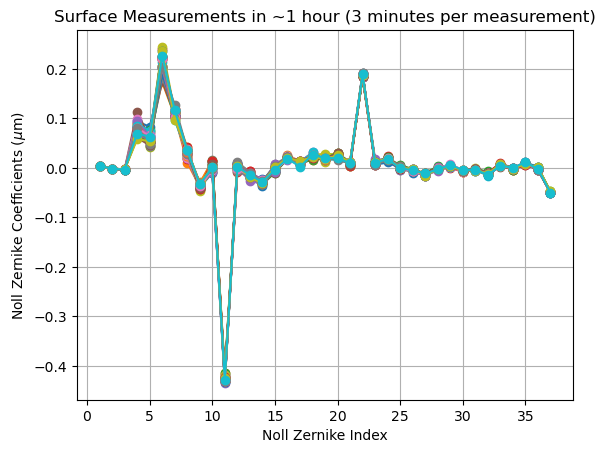

In [14]:
plt.plot(np.arange(1, nzer+1), zercoeff.T,'-o')
plt.ylabel(r'Noll Zernike Coefficients ($\mu$m)')
plt.xlabel('Noll Zernike Index')
plt.title('Surface Measurements in ~1 hour (3 minutes per measurement)')
plt.grid();

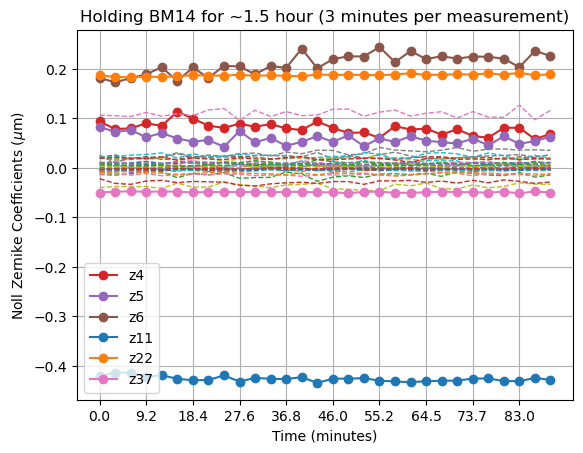

In [15]:
for i in range(nzer):
    if (i+1) in [4,5,6,11,22,37]:
        plt.plot(np.arange(1, nMeasure+1), zercoeff[:,i],'-o',label='z%d'%(i+1))
    else:
        plt.plot(np.arange(1, nMeasure+1), zercoeff[:,i],'--', linewidth=1)
plt.ylabel(r'Noll Zernike Coefficients ($\mu$m)')
plt.xlabel('Time (minutes)')
plt.title('Holding BM14 for ~1.5 hour (3 minutes per measurement)')
plt.legend()
tt = np.array([unix_ts(ts)/60. for ts in ts_array])
tt -= tt[0]
tt = ['%.1f'%i for i in tt]
plt.xticks(np.arange(1,nMeasure+1,3), tt[::3])
plt.grid();

### Step 13, recheck nominal forces

In [16]:
#load the most recent previous map with the nominal forces (end of step 7-11)
dateID = '250114'
stepN = 7
signedbend = ['+500nmBM1 ', '+500nmBM2 ', '-500nmBM1 ', '-500nmBM2 ', '+400nmBM14', '-400nmBM14']
glob_string = '%s/Sec 8/%s*step %d*%s*-.h5'%(ml_data_dir,dateID, stepN, signedbend[-1])
fileset = sorted(glob.glob(glob_string))
#print(glob_string, len(fileset))
if len(fileset)==1:
    m1s11,centerRow,centerCol,pixelSize, ts11 = readH5Map(fileset) #, verbose=False)
    
#load step 13 map
stepN = 13
glob_string = '%s/Sec 8/%s*step %d*-.h5'%(ml_data_dir,dateID, stepN)
fileset = sorted(glob.glob(glob_string))
#print(glob_string, len(fileset))
if len(fileset)==1:
    m1s13,centerRow,centerCol,pixelSize, ts13 = readH5Map(fileset) #, verbose=False)

m1s = m1s13 - m1s11 #we will look at the change in surface

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 7-11 -400nmBM14 set01 gmtMorph170614 -.h5: Tue Jan 14 14:47:22 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 13 set01 gmtMorph170614 -.h5: Tue Jan 14 16:36:52 2025 


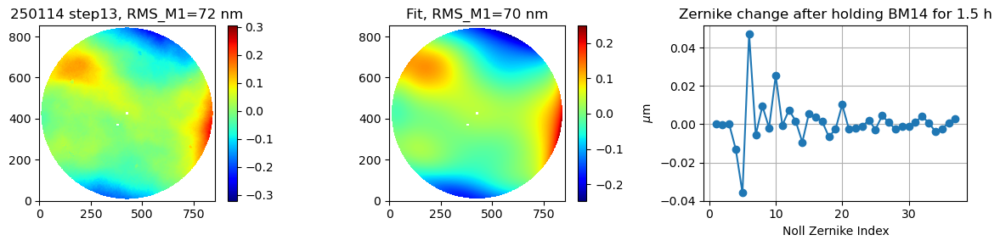

In [17]:
fig, ax = plt.subplots(1,3,figsize=(12,3))
img = ax[0].imshow(m1s, origin='lower')
fig.colorbar(img, ax=ax[0])
m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
ax[0].set_title('%s step%d, RMS_M1=%.0f nm'%(dateID,stepN, m1rms))

maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
nnodesNew = np.sum(maskNew)
mycoeff = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
recon = np.zeros_like(m1s)
recon[~maskNew] = np.nan
for k in range(nzer):
    recon[maskNew] += mycoeff[k]*zerU[maskNew.flatten(),k]  
img = ax[1].imshow(recon, origin='lower')          
fig.colorbar(img, ax=ax[1])
m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
ax[1].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))

ax[2].plot(np.arange(1,nzer+1),mycoeff,'-o')
ax[2].set_title('Zernike change after holding BM14 for 1.5 h')
ax[2].grid()
ax[2].set_ylabel(r'$\mu$m')
ax[2].set_xlabel('Noll Zernike Index')
plt.tight_layout()

### Step 14, after lowering

In [18]:
#load step 14 map
stepN = 14
dateID = '250114'
glob_string = '%s/Sec 8/%s*step %d*-.h5'%(ml_data_dir,dateID, stepN)
fileset = sorted(glob.glob(glob_string))
#print(glob_string, len(fileset))
assert len(fileset)==1
m1s14,centerRow,centerCol,pixelSize, ts14 = readH5Map(fileset) #, verbose=False)

m1s = m1s14 - m1s13  #we will look at the change in surface

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250114 GMT3 Sec 8-2 step 14 set01 gmtMorph170614 -.h5: Tue Jan 14 16:53:40 2025 


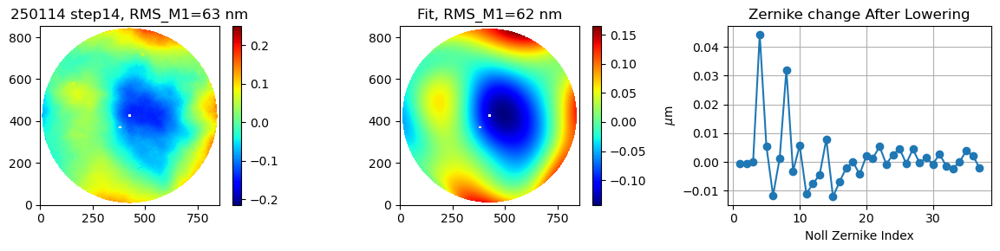

In [19]:
fig, ax = plt.subplots(1,3,figsize=(12,3))
img = ax[0].imshow(m1s, origin='lower')
fig.colorbar(img, ax=ax[0])
m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
ax[0].set_title('%s step%d, RMS_M1=%.0f nm'%(dateID,stepN, m1rms))

maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
nnodesNew = np.sum(maskNew)
mycoeff = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
recon = np.zeros_like(m1s)
recon[~maskNew] = np.nan
for k in range(nzer):
    recon[maskNew] += mycoeff[k]*zerU[maskNew.flatten(),k]  
img = ax[1].imshow(recon, origin='lower')          
fig.colorbar(img, ax=ax[1])
m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
ax[1].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))

ax[2].plot(np.arange(1,nzer+1),mycoeff,'-o')
ax[2].set_title('Zernike change After Lowering')
ax[2].grid()
ax[2].set_ylabel(r'$\mu$m')
ax[2].set_xlabel('Noll Zernike Index')
plt.tight_layout()

## Started next day by repeating step 14

In [20]:
#load step 14 map
dateID = '250115'
stepN = 14

globstring = '%s/Sec 8/%s*step %d*.h5'%(ml_data_dir, dateID, stepN) #not using dateID. Data split into 0117 and 0121
#print(globstring)
fileset = sorted(glob.glob(globstring))
nMeasure = len(fileset)
print(nMeasure)

3


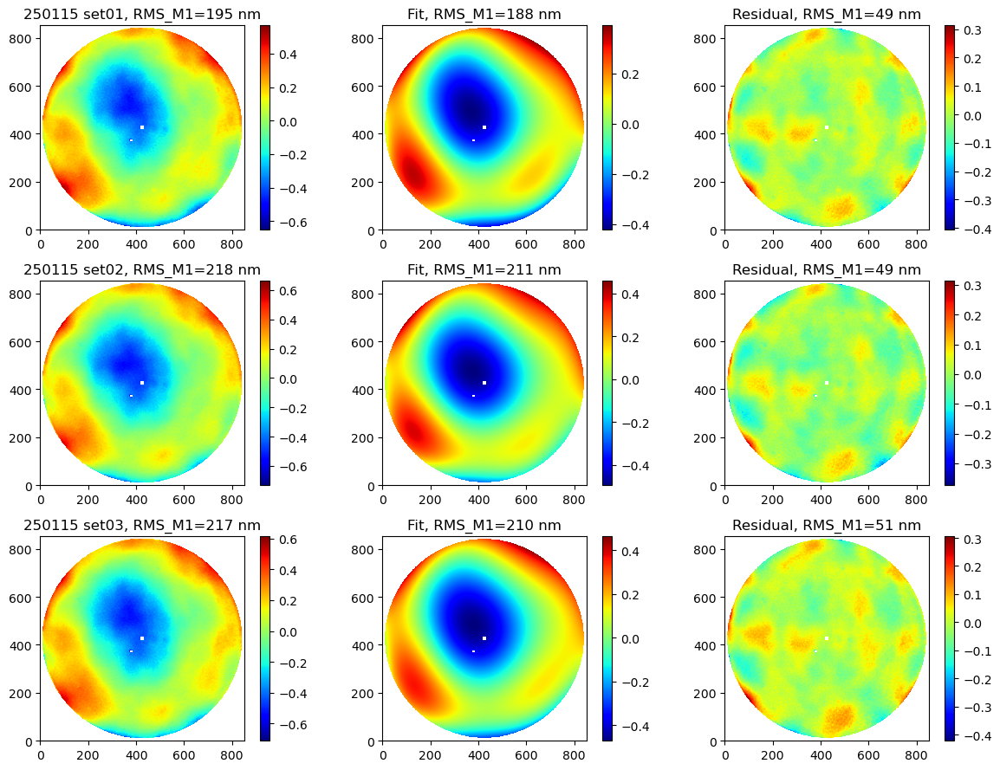

In [21]:
nzer = 22
zercoeff = np.zeros((nMeasure, nzer))

[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)
r1 = np.sqrt(x1**2 + y1**2)

nnodes = x1.shape[0]*x1.shape[1]
zerU = np.zeros((nnodes, nzer))
for i in range(nzer):
    zerU[:,i] = zernike_polynomial(i+1, x1/radius_of_CA, y1/radius_of_CA).flatten()

nrow = nMeasure
fig, ax = plt.subplots(nrow,3,figsize=(12,3*nrow))
ts_array = []
for i in range(nMeasure):
    irow = i
    #print(irow, icol)
    glob_string = '%s/Sec 8/%s*step %d *set%02d*-.h5'%(ml_data_dir,dateID, stepN, i+1)
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, fileset)
    if len(fileset)>0:
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset, verbose=False)
        ts_array.append(ts)

        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        icol = 0
        img = ax[irow][icol].imshow(m1s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%s set%02d, RMS_M1=%.0f nm'%(dateID,i+1, m1rms))
        
        icol = 1
        maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
        nnodesNew = np.sum(maskNew)
        zercoeff[i,:] = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
        recon = np.zeros_like(m1s)
        recon[~maskNew] = np.nan
        for k in range(nzer):
            recon[maskNew] += zercoeff[i,k]*zerU[maskNew.flatten(),k]  
        img = ax[irow][icol].imshow(recon, origin='lower')          
        fig.colorbar(img, ax=ax[irow][icol])
        m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
        ax[irow][icol].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))
        
        icol = 2
        resi = m1s - recon
        img = ax[irow][icol].imshow(resi, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])        
        m1rms = np.std(resi[~np.isnan(resi)])*1000 #convert into nm
        ax[irow][icol].set_title('Residual, RMS_M1=%.0f nm'%(m1rms))        
plt.tight_layout()

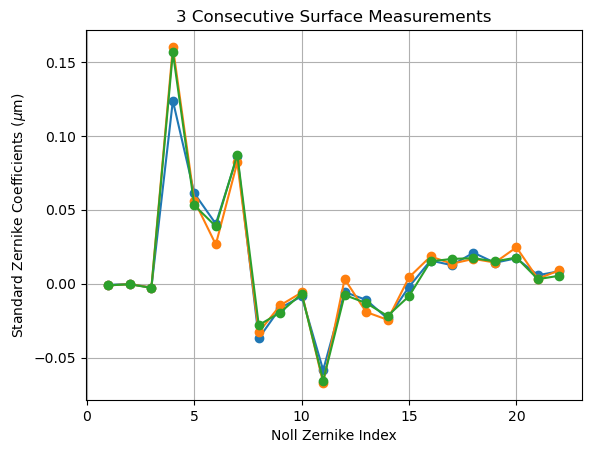

In [22]:
plt.plot(np.arange(1, nzer+1), zercoeff.T,'-o')
plt.ylabel(r'Standard Zernike Coefficients ($\mu$m)')
plt.xlabel('Noll Zernike Index')
plt.title('3 Consecutive Surface Measurements')
plt.grid();

In [28]:
#load step 14 maps on 250115, and average them
stepN = 14
glob_string = '%s/Sec 8/%s*step %d*-.h5'%(ml_data_dir,dateID, stepN)
fileset = sorted(glob.glob(glob_string))
#print(glob_string, len(fileset))
assert len(fileset)==3
m1s14p,centerRow,centerCol,pixelSize, ts14p = readH5Map(fileset) #, verbose=False)
m1s = m1s14p - m1s14

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 initial set01 gmtMorph170614 -.h5: Wed Jan 15 11:20:44 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 14 LowerAndRaise After set01 gmtMorph170614 -.h5: Wed Jan 15 11:05:55 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 14 LowerAndRaise After set02 gmtMorph170614 -.h5: Wed Jan 15 11:09:09 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 14 LowerAndRaise After set03 gmtMorph170614 -.h5: Wed Jan 15 11:12:22 2025 


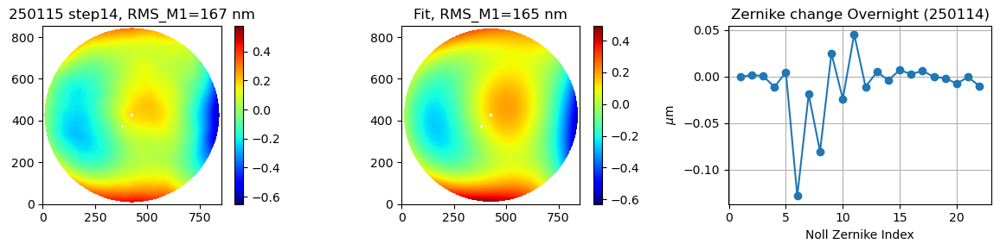

In [29]:
fig, ax = plt.subplots(1,3,figsize=(12,3))
img = ax[0].imshow(m1s, origin='lower')
fig.colorbar(img, ax=ax[0])
m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
ax[0].set_title('%s step%d, RMS_M1=%.0f nm'%(dateID,stepN, m1rms))

maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
nnodesNew = np.sum(maskNew)
mycoeff = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
recon = np.zeros_like(m1s)
recon[~maskNew] = np.nan
for k in range(nzer):
    recon[maskNew] += mycoeff[k]*zerU[maskNew.flatten(),k]  
img = ax[1].imshow(recon, origin='lower')          
fig.colorbar(img, ax=ax[1])
m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
ax[1].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))

ax[2].plot(np.arange(1,nzer+1),mycoeff,'-o')
ax[2].set_title('Zernike change Overnight (250114)')
ax[2].grid()
ax[2].set_ylabel(r'$\mu$m')
ax[2].set_xlabel('Noll Zernike Index')
plt.tight_layout()

### Steps 15-22: 

15.Apply lateral rigid body motion to M1S3 with the hardpoints (1 mm in +x), return to the nominal position, and immediately measure M1S3. 

16.Apply lateral rigid body motion to M1S3 with the hardpoints (1 mm in +y), return to the nominal position, and immediately measure M1S3. 

17.Apply lateral rigid body motion to M1S3 with the hardpoints (1 mm in +z), return to the nominal position, and immediately measure M1S3. 

18.Repeat Steps 15-17 with -1 mm motion in x, y, and z.

19.Apply rigid body tilt motion to M1S3 with the hardpoints (1 arcmin around x), return to the nominal position, and immediately measure M1S3. 

20.Apply rigid body tilt motion to M1S3 with the hardpoints (1 arcmin around y), return to the nominal position, and immediately measure M1S3. 

21.Apply rigid body rotation to M1S3 with the hardpoints (1 arcmin around z), return to the nominal position, and immediately measure M1S3. 

22.Repeat Steps 19-21 with -1 arcmin of rotation/tilt angle around x, y, and z.

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 initial set01 gmtMorph170614 -.h5: Wed Jan 15 11:20:44 2025 
12
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 15 +1X set01 gmtMorph170614 -.h5: Wed Jan 15 11:27:05 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 16 +1Y set01 gmtMorph170614 -.h5: Wed Jan 15 11:33:16 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 17 +1Z set01 gmtMorph170614 -.h5: Wed Jan 15 11:39:50 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 18 -1X set01 gmtMorph170614 -.h5: Wed Jan 15 11:46:16 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec 8-2 step 18 -1Y set01 gmtMorph170614 -.h5: Wed Jan 15 11:52:17 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 8/250115 GMT3 Sec

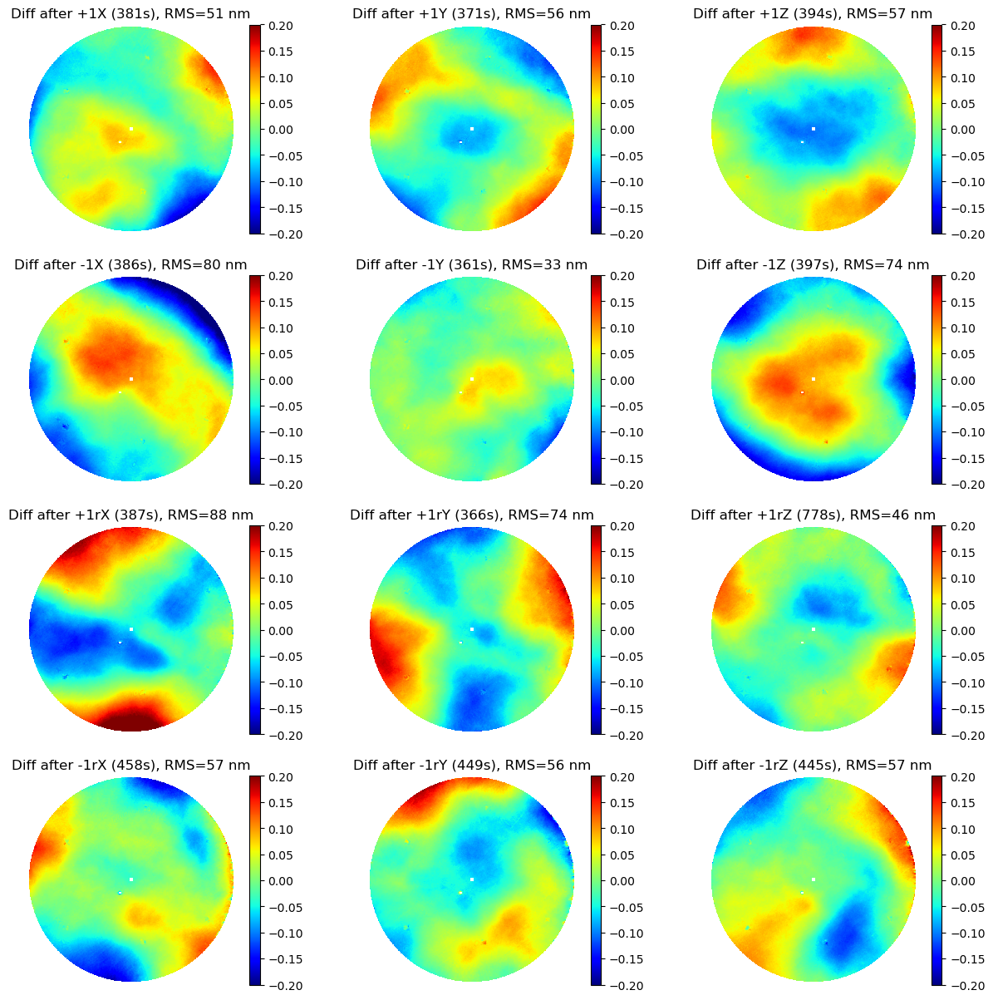

In [41]:
#there was also an "initial" map for 250115, based on timestamp, this was taken after step 14
glob_string = '%s/Sec 8/%s*initial*-.h5'%(ml_data_dir,dateID)
fileset = sorted(glob.glob(glob_string))
#print(glob_string, fileset)
assert len(fileset)==1
m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset) #, verbose=False)
m1sPrev = m1s.copy()
tsPrev = ts #string cannot be copied. just assign it

stepN = 15
motionStr = ['+1X', '+1Y', '+1Z', '-1X','-1Y', '-1Z', '+1rX', '+1rY', '+1rZ', '-1rX', '-1rY', '-1rZ']
print(len(motionStr))

fig, ax = plt.subplots(4,3,figsize=(15,15))

for i,mot in enumerate(motionStr):
    glob_string = '%s/Sec 8/%s*step *%s*-.h5'%(ml_data_dir,dateID, mot)
    fileset = sorted(glob.glob(glob_string))
    #print(glob_string, len(fileset))
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset) #, verbose=False)
    #print(bend, i)
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    m1sdiff = m1s - m1sPrev
    m1rms = np.std(m1sdiff[~np.isnan(m1sdiff)])*1000 #convert into nm
    img = ax[irow][icol].imshow(m1sdiff, origin='lower', vmin=-0.2, vmax=0.2)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('Diff after %s (%.0fs), RMS=%.0f nm'%(mot, unix_ts(ts)-unix_ts(tsPrev), m1rms))
    ax[irow][icol].axis('off')    
    m1sPrev = m1s.copy()
    tsPrev = ts

### Step 25. SA swap, 136 vs 336

### Step 28. SA swap, 222 vs 422

### Step 31. SA swap, 126 vs 326